In [ ]:
!pip install tensorflow-addons

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 611.8/611.8 kB 3.4 MB/s eta 0:00:00


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

import tensorflow_addons as tfa
import tensorflow_datasets as tfds

tfds.disable_progress_bar()
autotune = tf.data.AUTOTUNE

/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


In [ ]:
dataset, _ = tfds.load("cycle_gan/monet2photo", with_info=True, as_supervised=True)
train_monet, train_photo = dataset["trainA"], dataset["trainB"]
test_monet, test_photo = dataset["testA"], dataset["testB"]

Dataset cycle_gan downloaded and prepared to /root/tensorflow_datasets/cycle_gan/monet2photo/3.0.0. Subsequent calls will reuse this data.


In [ ]:
# Define the standard image size.
orig_img_size = (286, 286)
# Size of the random crops to be used during training.
input_img_size = (256, 256, 3)
# Weights initializer for the layers.
kernel_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)
# Gamma initializer for instance normalization.
gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

buffer_size = 256
batch_size = 1


def normalize_img(img):
    img = tf.cast(img, dtype=tf.float32)
    # Map values in the range [-1, 1]
    return (img / 127.5) - 1.0


def preprocess_train_image(img, label):
    # Random flip
    img = tf.image.random_flip_left_right(img)
    # Resize to the original size first
    img = tf.image.resize(img, [*orig_img_size])
    # Random crop to 256X256
    img = tf.image.random_crop(img, size=[*input_img_size])
    # Normalize the pixel values in the range [-1, 1]
    img = normalize_img(img)
    return img


def preprocess_test_image(img, label):
    # Only resizing and normalization for the test images.
    img = tf.image.resize(img, [input_img_size[0], input_img_size[1]])
    img = normalize_img(img)
    return img

In [ ]:
# Apply the preprocessing operations to the training data
train_monet = (
    train_monet.map(preprocess_train_image, num_parallel_calls=autotune)
    .cache()
    .shuffle(buffer_size)
    .batch(batch_size)
)
train_photo = (
    train_photo.map(preprocess_train_image, num_parallel_calls=autotune)
    .cache()
    .shuffle(buffer_size)
    .batch(batch_size)
)

# Apply the preprocessing operations to the test data
test_monet = (
    test_monet.map(preprocess_test_image, num_parallel_calls=autotune)
    .cache()
    .shuffle(buffer_size)
    .batch(batch_size)
)
test_photo = (
    test_photo.map(preprocess_test_image, num_parallel_calls=autotune)
    .cache()
    .shuffle(buffer_size)
    .batch(batch_size)
)

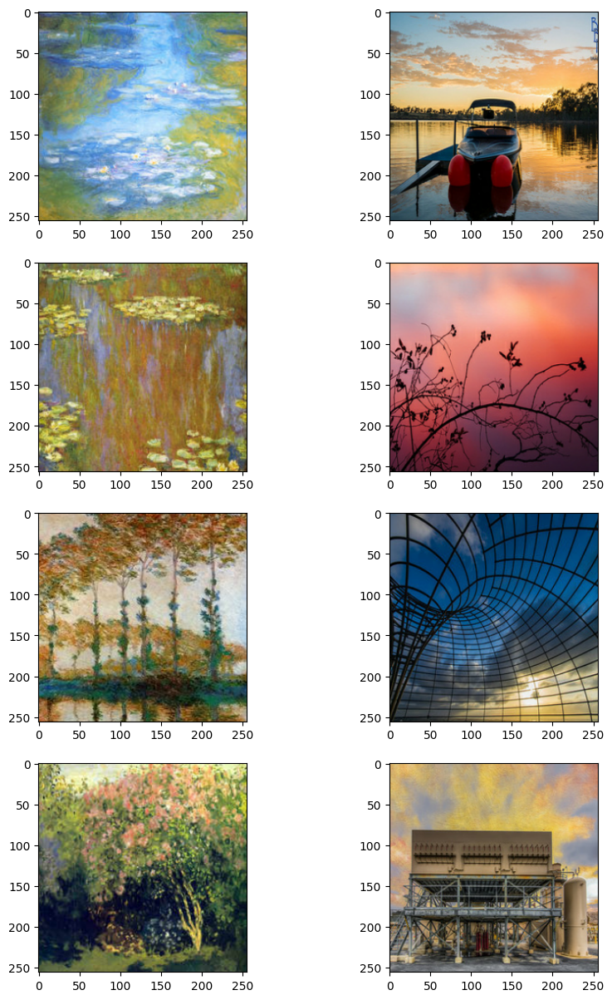

In [ ]:
_, ax = plt.subplots(4, 2, figsize=(10, 15))
for i, samples in enumerate(zip(train_monet.take(4), train_photo.take(4))):
    monet = (((samples[0][0] * 127.5) + 127.5).numpy()).astype(np.uint8)
    photo = (((samples[1][0] * 127.5) + 127.5).numpy()).astype(np.uint8)
    ax[i, 0].imshow(monet)
    ax[i, 1].imshow(photo)
plt.show()

In [ ]:
def get_resnet_generator(
    filters=64,
    num_downsampling_blocks=2,
    num_residual_blocks=9,
    num_upsample_blocks=2,
    gamma_initializer=gamma_init,
    name=None,
):
    img_input = layers.Input(shape=input_img_size, name=name + "_img_input")
    x = ReflectionPadding2D(padding=(3, 3))(img_input)
    x = layers.Conv2D(filters, (7, 7), kernel_initializer=kernel_init, use_bias=False)(
        x
    )
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    x = layers.Activation("relu")(x)

    # Downsampling
    for _ in range(num_downsampling_blocks):
        filters *= 2
        x = downsample(x, filters=filters, activation=layers.Activation("relu"))

    # Residual blocks
    for _ in range(num_residual_blocks):
        x = residual_block(x, activation=layers.Activation("relu"))

    # Upsampling
    for _ in range(num_upsample_blocks):
        filters //= 2
        x = upsample(x, filters, activation=layers.Activation("relu"))

    # Final block
    x = ReflectionPadding2D(padding=(3, 3))(x)
    x = layers.Conv2D(3, (7, 7), padding="valid")(x)
    x = layers.Activation("tanh")(x)

    model = keras.models.Model(img_input, x, name=name)
    return model

In [ ]:
class ReflectionPadding2D(layers.Layer):
    """Implements Reflection Padding as a layer.

    Args:
        padding(tuple): Amount of padding for the
        spatial dimensions.

    Returns:
        A padded tensor with the same type as the input tensor.
    """

    def __init__(self, padding=(1, 1), **kwargs):
        self.padding = tuple(padding)
        super().__init__(**kwargs)

    def call(self, input_tensor, mask=None):
        padding_width, padding_height = self.padding
        padding_tensor = [
            [0, 0],
            [padding_height, padding_height],
            [padding_width, padding_width],
            [0, 0],
        ]
        return tf.pad(input_tensor, padding_tensor, mode="REFLECT")


def residual_block(
    x,
    activation,
    kernel_initializer=kernel_init,
    kernel_size=(3, 3),
    strides=(1, 1),
    padding="valid",
    gamma_initializer=gamma_init,
    use_bias=False,
):
    dim = x.shape[-1]
    input_tensor = x

    x = ReflectionPadding2D()(input_tensor)
    x = layers.Conv2D(
        dim,
        kernel_size,
        strides=strides,
        kernel_initializer=kernel_initializer,
        padding=padding,
        use_bias=use_bias,
    )(x)
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    x = activation(x)

    x = ReflectionPadding2D()(x)
    x = layers.Conv2D(
        dim,
        kernel_size,
        strides=strides,
        kernel_initializer=kernel_initializer,
        padding=padding,
        use_bias=use_bias,
    )(x)
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    x = layers.add([input_tensor, x])
    return x


def downsample(
    x,
    filters,
    activation,
    kernel_initializer=kernel_init,
    kernel_size=(3, 3),
    strides=(2, 2),
    padding="same",
    gamma_initializer=gamma_init,
    use_bias=False,
):
    x = layers.Conv2D(
        filters,
        kernel_size,
        strides=strides,
        kernel_initializer=kernel_initializer,
        padding=padding,
        use_bias=use_bias,
    )(x)
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    if activation:
        x = activation(x)
    return x


def upsample(
    x,
    filters,
    activation,
    kernel_size=(3, 3),
    strides=(2, 2),
    padding="same",
    kernel_initializer=kernel_init,
    gamma_initializer=gamma_init,
    use_bias=False,
):
    x = layers.Conv2DTranspose(
        filters,
        kernel_size,
        strides=strides,
        padding=padding,
        kernel_initializer=kernel_initializer,
        use_bias=use_bias,
    )(x)
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    if activation:
        x = activation(x)
    return x

In [ ]:
def get_discriminator(
    filters=64, kernel_initializer=kernel_init, num_downsampling=3, name=None
):
    img_input = layers.Input(shape=input_img_size, name=name + "_img_input")
    x = layers.Conv2D(
        filters,
        (4, 4),
        strides=(2, 2),
        padding="same",
        kernel_initializer=kernel_initializer,
    )(img_input)
    x = layers.LeakyReLU(0.2)(x)

    num_filters = filters
    for num_downsample_block in range(3):
        num_filters *= 2
        if num_downsample_block < 2:
            x = downsample(
                x,
                filters=num_filters,
                activation=layers.LeakyReLU(0.2),
                kernel_size=(4, 4),
                strides=(2, 2),
            )
        else:
            x = downsample(
                x,
                filters=num_filters,
                activation=layers.LeakyReLU(0.2),
                kernel_size=(4, 4),
                strides=(1, 1),
            )

    x = layers.Conv2D(
        1, (4, 4), strides=(1, 1), padding="same", kernel_initializer=kernel_initializer
    )(x)

    model = keras.models.Model(inputs=img_input, outputs=x, name=name)
    return model


# Get the generators
gen_G = get_resnet_generator(name="generator_G")
gen_F = get_resnet_generator(name="generator_F")

# Get the discriminators
disc_X = get_discriminator(name="discriminator_X")
disc_Y = get_discriminator(name="discriminator_Y")

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer RandomNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


In [ ]:
!pip install tensorflow-addons

In [ ]:
import tensorflow_addons as tfa

/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


In [ ]:
class CycleGan(keras.Model):
    def __init__(
        self,
        generator_G,
        generator_F,
        discriminator_X,
        discriminator_Y,
        lambda_cycle=10.0,
        lambda_identity=0.5,
    ):
        super().__init__()
        self.gen_G = generator_G
        self.gen_F = generator_F
        self.disc_X = discriminator_X
        self.disc_Y = discriminator_Y
        self.lambda_cycle = lambda_cycle
        self.lambda_identity = lambda_identity

    def compile(
        self,
        gen_G_optimizer,
        gen_F_optimizer,
        disc_X_optimizer,
        disc_Y_optimizer,
        gen_loss_fn,
        disc_loss_fn,
    ):
        super().compile()
        self.gen_G_optimizer = gen_G_optimizer
        self.gen_F_optimizer = gen_F_optimizer
        self.disc_X_optimizer = disc_X_optimizer
        self.disc_Y_optimizer = disc_Y_optimizer
        self.generator_loss_fn = gen_loss_fn
        self.discriminator_loss_fn = disc_loss_fn
        self.cycle_loss_fn = keras.losses.MeanAbsoluteError()
        self.identity_loss_fn = keras.losses.MeanAbsoluteError()

    def train_step(self, batch_data):
        # x is monet and y is photo
        real_x, real_y = batch_data

        with tf.GradientTape(persistent=True) as tape:

            fake_y = self.gen_G(real_x, training=True)
            fake_x = self.gen_F(real_y, training=True)
            cycled_x = self.gen_F(fake_y, training=True)
            cycled_y = self.gen_G(fake_x, training=True)

            # Identity mapping
            same_x = self.gen_F(real_x, training=True)
            same_y = self.gen_G(real_y, training=True)

            # Discriminator output
            disc_real_x = self.disc_X(real_x, training=True)
            disc_fake_x = self.disc_X(fake_x, training=True)

            disc_real_y = self.disc_Y(real_y, training=True)
            disc_fake_y = self.disc_Y(fake_y, training=True)

            # Generator adversarial loss
            gen_G_loss = self.generator_loss_fn(disc_fake_y)
            gen_F_loss = self.generator_loss_fn(disc_fake_x)

            # Generator cycle loss
            cycle_loss_G = self.cycle_loss_fn(real_y, cycled_y) * self.lambda_cycle
            cycle_loss_F = self.cycle_loss_fn(real_x, cycled_x) * self.lambda_cycle

            # Generator identity loss
            id_loss_G = (
                self.identity_loss_fn(real_y, same_y)
                * self.lambda_cycle
                * self.lambda_identity
            )
            id_loss_F = (
                self.identity_loss_fn(real_x, same_x)
                * self.lambda_cycle
                * self.lambda_identity
            )

            # Total generator loss
            total_loss_G = gen_G_loss + cycle_loss_G + id_loss_G
            total_loss_F = gen_F_loss + cycle_loss_F + id_loss_F

            # Discriminator loss
            disc_X_loss = self.discriminator_loss_fn(disc_real_x, disc_fake_x)
            disc_Y_loss = self.discriminator_loss_fn(disc_real_y, disc_fake_y)

        # Get the gradients for the generators
        grads_G = tape.gradient(total_loss_G, self.gen_G.trainable_variables)
        grads_F = tape.gradient(total_loss_F, self.gen_F.trainable_variables)

        # Get the gradients for the discriminators
        disc_X_grads = tape.gradient(disc_X_loss, self.disc_X.trainable_variables)
        disc_Y_grads = tape.gradient(disc_Y_loss, self.disc_Y.trainable_variables)

        # Update the weights of the generators
        self.gen_G_optimizer.apply_gradients(
            zip(grads_G, self.gen_G.trainable_variables)
        )
        self.gen_F_optimizer.apply_gradients(
            zip(grads_F, self.gen_F.trainable_variables)
        )

        # Update the weights of the discriminators
        self.disc_X_optimizer.apply_gradients(
            zip(disc_X_grads, self.disc_X.trainable_variables)
        )
        self.disc_Y_optimizer.apply_gradients(
            zip(disc_Y_grads, self.disc_Y.trainable_variables)
        )

        return {
            "G_loss": total_loss_G,
            "F_loss": total_loss_F,
            "D_X_loss": disc_X_loss,
            "D_Y_loss": disc_Y_loss,
        }

In [ ]:
class GANMonitor(keras.callbacks.Callback):
    """A callback to generate and save images after each epoch"""

    def __init__(self, num_img=4):
        self.num_img = num_img

    def on_epoch_end(self, epoch, logs=None):
        _, ax = plt.subplots(4, 2, figsize=(12, 12))
        for i, img in enumerate(test_monet.take(self.num_img)):
            prediction = self.model.gen_G(img)[0].numpy()
            prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
            img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

            ax[i, 0].imshow(img)
            ax[i, 1].imshow(prediction)
            ax[i, 0].set_title("Input image")
            ax[i, 1].set_title("Translated image")
            ax[i, 0].axis("off")
            ax[i, 1].axis("off")

            prediction = keras.utils.array_to_img(prediction)
            prediction.save(
                "generated_img_{i}_{epoch}.png".format(i=i, epoch=epoch + 1)
            )
        plt.show()
        plt.close()

Epoch 1/20
1072/1072 [==============================] - ETA: 0s - G_loss: 4.7282 - F_loss: 4.4907 - D_X_loss: 0.1663 - D_Y_loss: 0.1685

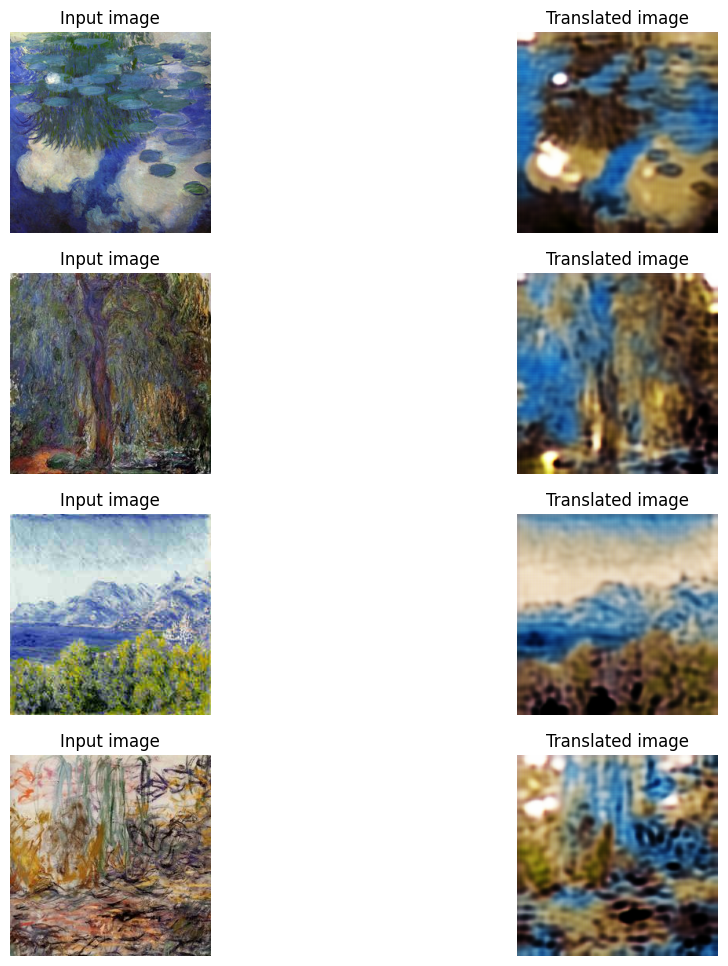

1072/1072 [==============================] - 749s 641ms/step - G_loss: 4.7280 - F_loss: 4.4912 - D_X_loss: 0.1663 - D_Y_loss: 0.1685
Epoch 2/20
1072/1072 [==============================] - ETA: 0s - G_loss: 3.6907 - F_loss: 3.7510 - D_X_loss: 0.1920 - D_Y_loss: 0.2179

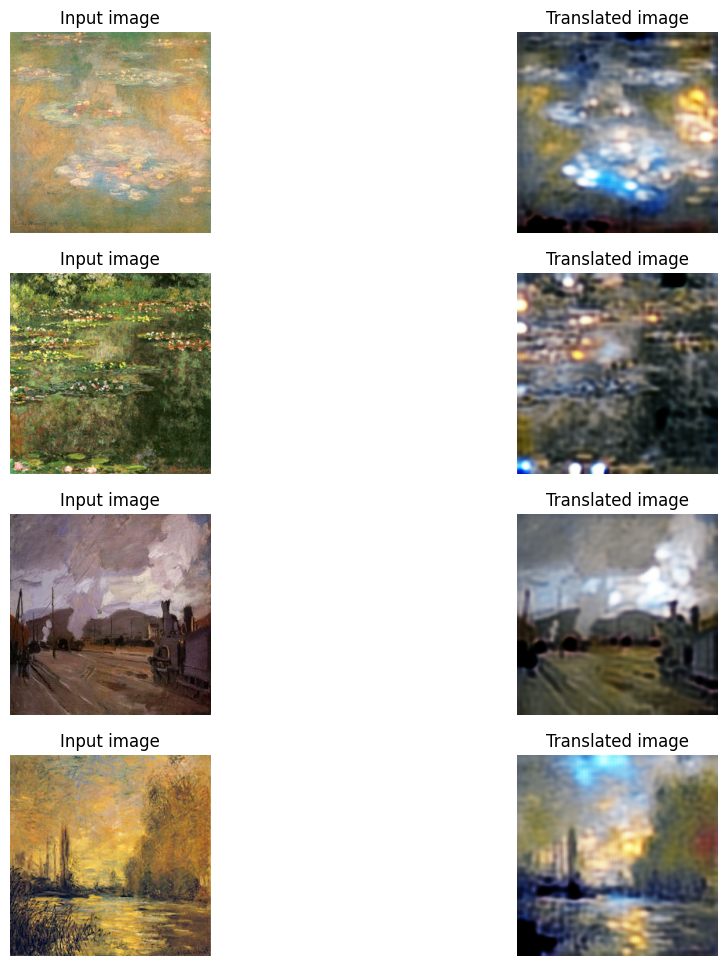

1072/1072 [==============================] - 685s 639ms/step - G_loss: 3.6907 - F_loss: 3.7504 - D_X_loss: 0.1920 - D_Y_loss: 0.2179
Epoch 3/20
1072/1072 [==============================] - ETA: 0s - G_loss: 3.5747 - F_loss: 3.5974 - D_X_loss: 0.1814 - D_Y_loss: 0.1996

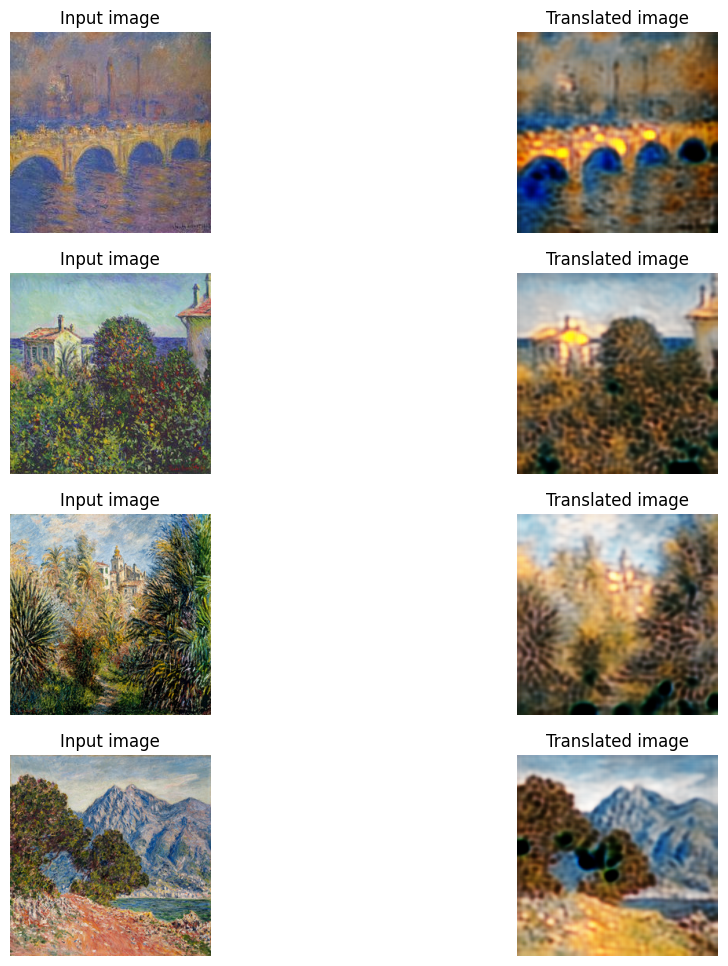

1072/1072 [==============================] - 686s 639ms/step - G_loss: 3.5740 - F_loss: 3.5966 - D_X_loss: 0.1814 - D_Y_loss: 0.1996
Epoch 4/20
1072/1072 [==============================] - ETA: 0s - G_loss: 3.4415 - F_loss: 3.4778 - D_X_loss: 0.1713 - D_Y_loss: 0.1900

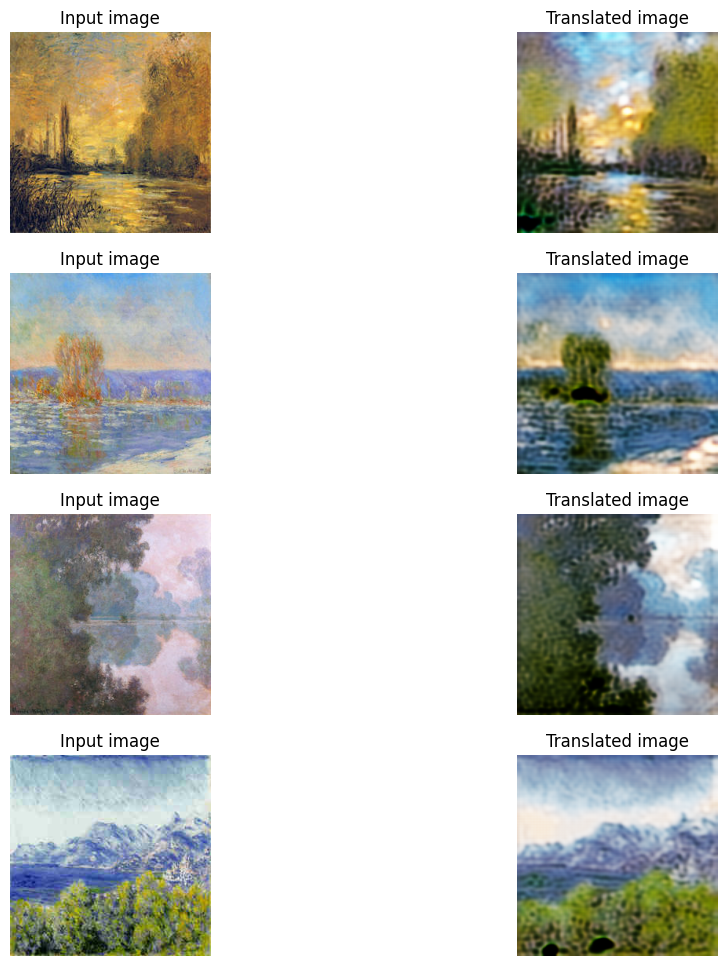

1072/1072 [==============================] - 683s 636ms/step - G_loss: 3.4403 - F_loss: 3.4786 - D_X_loss: 0.1712 - D_Y_loss: 0.1901
Epoch 5/20
1072/1072 [==============================] - ETA: 0s - G_loss: 3.3389 - F_loss: 3.3436 - D_X_loss: 0.1825 - D_Y_loss: 0.1869

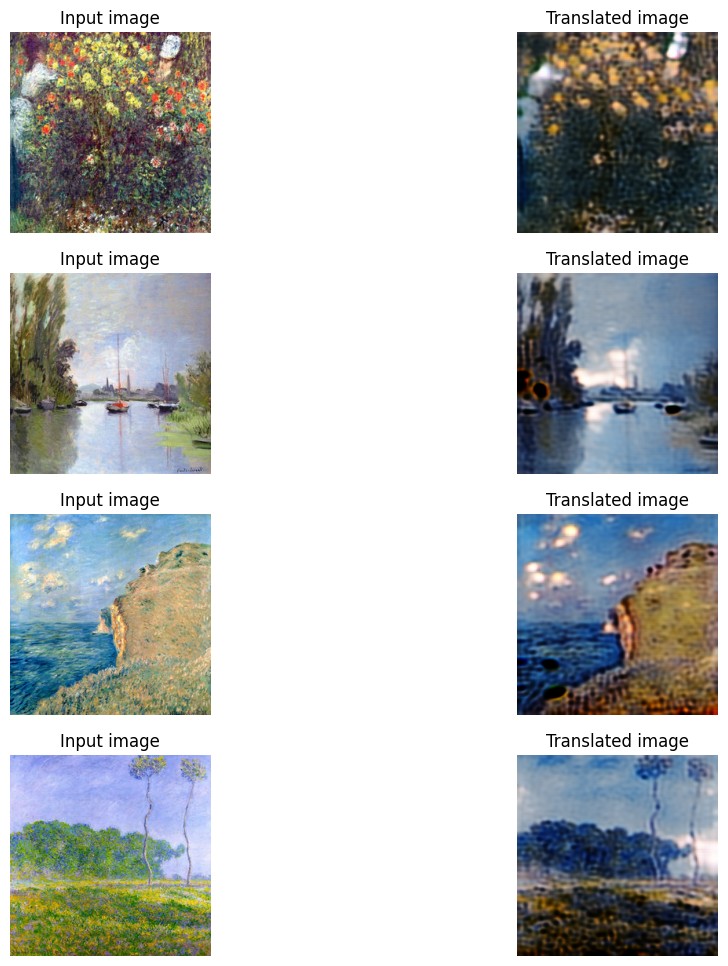

1072/1072 [==============================] - 686s 640ms/step - G_loss: 3.3394 - F_loss: 3.3428 - D_X_loss: 0.1827 - D_Y_loss: 0.1869
Epoch 6/20
1072/1072 [==============================] - ETA: 0s - G_loss: 3.3304 - F_loss: 3.2460 - D_X_loss: 0.1920 - D_Y_loss: 0.1924

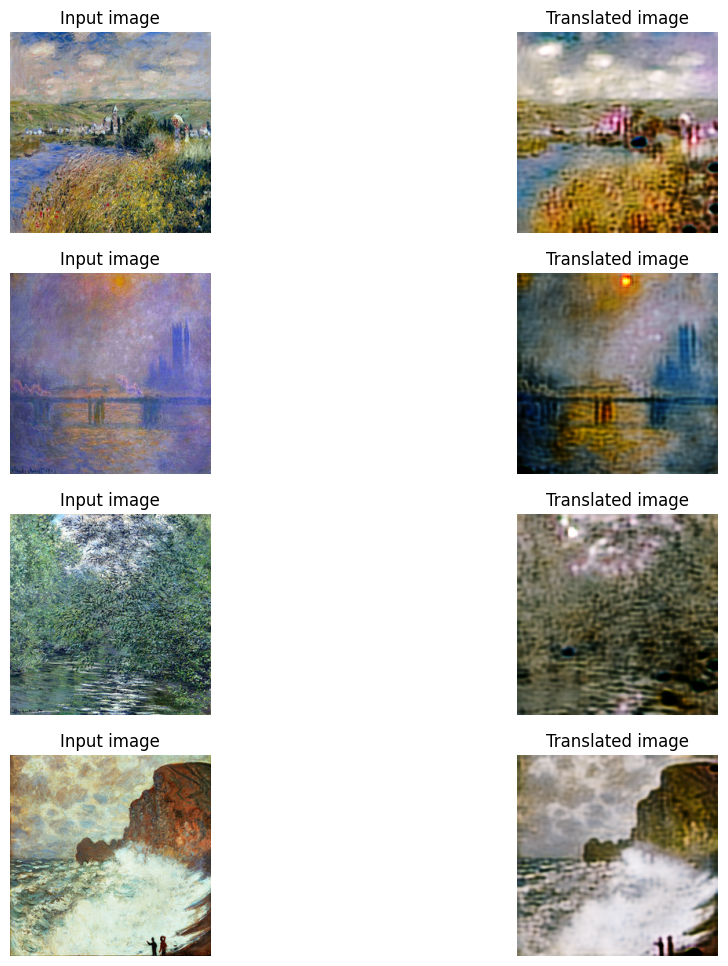

1072/1072 [==============================] - 683s 636ms/step - G_loss: 3.3296 - F_loss: 3.2455 - D_X_loss: 0.1919 - D_Y_loss: 0.1925
Epoch 7/20
1072/1072 [==============================] - ETA: 0s - G_loss: 3.2276 - F_loss: 3.1582 - D_X_loss: 0.2021 - D_Y_loss: 0.2008

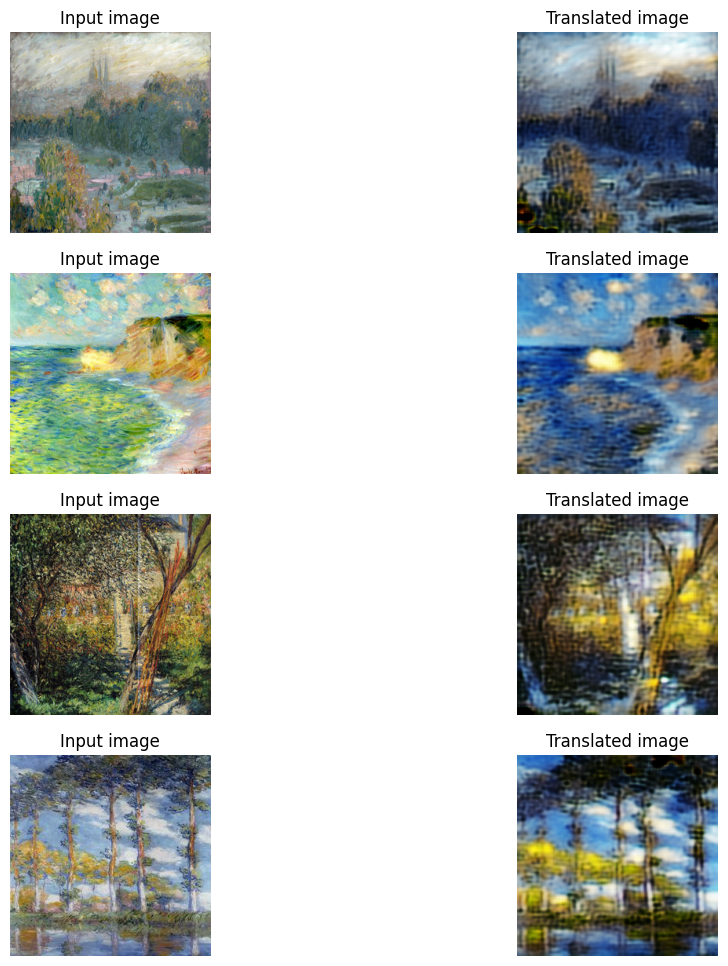

1072/1072 [==============================] - 684s 637ms/step - G_loss: 3.2274 - F_loss: 3.1594 - D_X_loss: 0.2020 - D_Y_loss: 0.2009
Epoch 8/20
1072/1072 [==============================] - ETA: 0s - G_loss: 3.1882 - F_loss: 3.0930 - D_X_loss: 0.2084 - D_Y_loss: 0.1999

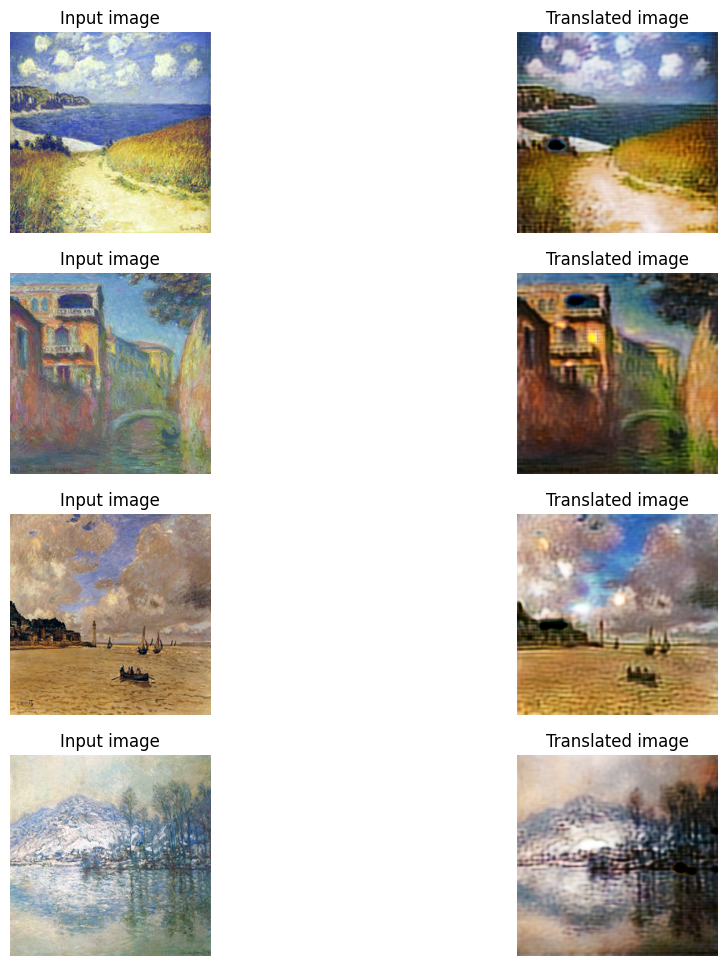

1072/1072 [==============================] - 686s 639ms/step - G_loss: 3.1872 - F_loss: 3.0933 - D_X_loss: 0.2083 - D_Y_loss: 0.1999
Epoch 9/20
1072/1072 [==============================] - ETA: 0s - G_loss: 3.1155 - F_loss: 3.0082 - D_X_loss: 0.2149 - D_Y_loss: 0.2013

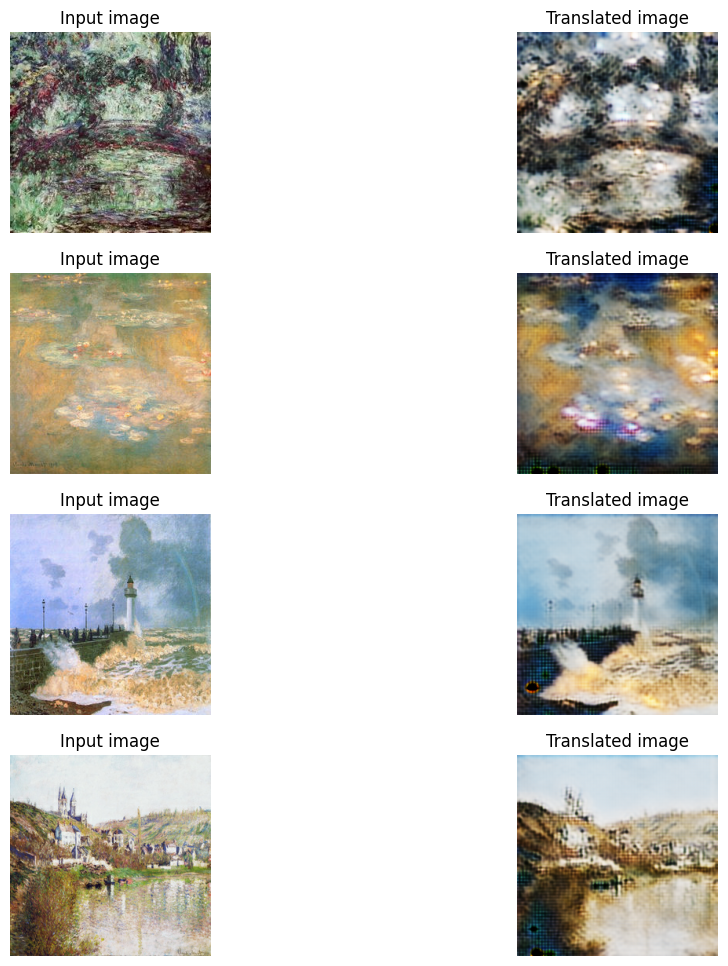

1072/1072 [==============================] - 686s 639ms/step - G_loss: 3.1154 - F_loss: 3.0075 - D_X_loss: 0.2149 - D_Y_loss: 0.2014
Epoch 10/20
1072/1072 [==============================] - ETA: 0s - G_loss: 3.1421 - F_loss: 2.9127 - D_X_loss: 0.2192 - D_Y_loss: 0.2030

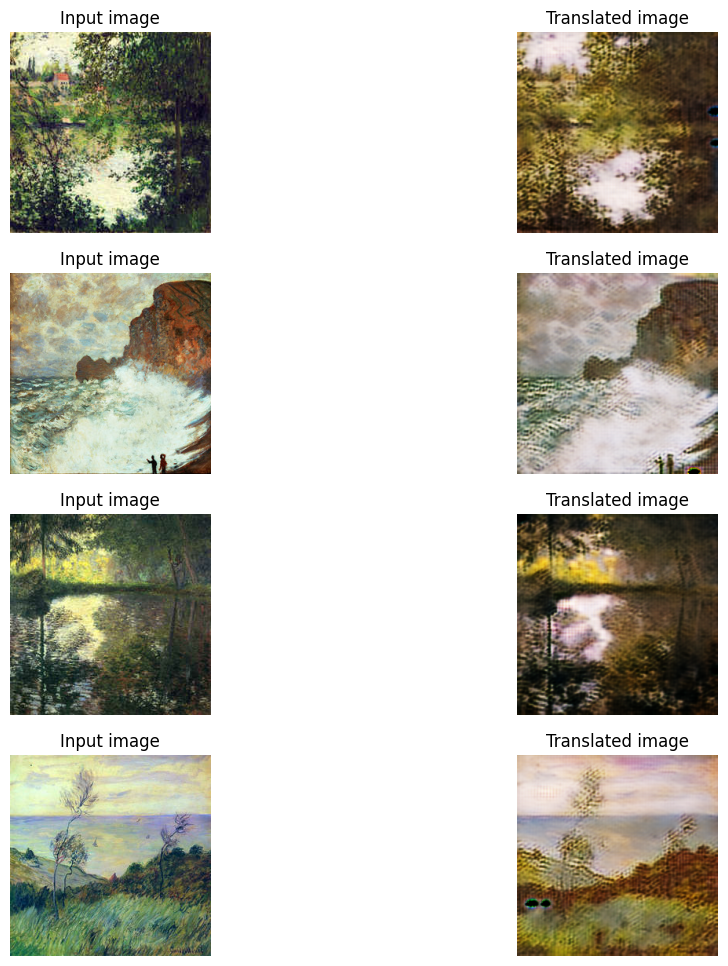

1072/1072 [==============================] - 690s 642ms/step - G_loss: 3.1432 - F_loss: 2.9117 - D_X_loss: 0.2193 - D_Y_loss: 0.2031
Epoch 11/20
1072/1072 [==============================] - ETA: 0s - G_loss: 3.0290 - F_loss: 2.8492 - D_X_loss: 0.2218 - D_Y_loss: 0.2050

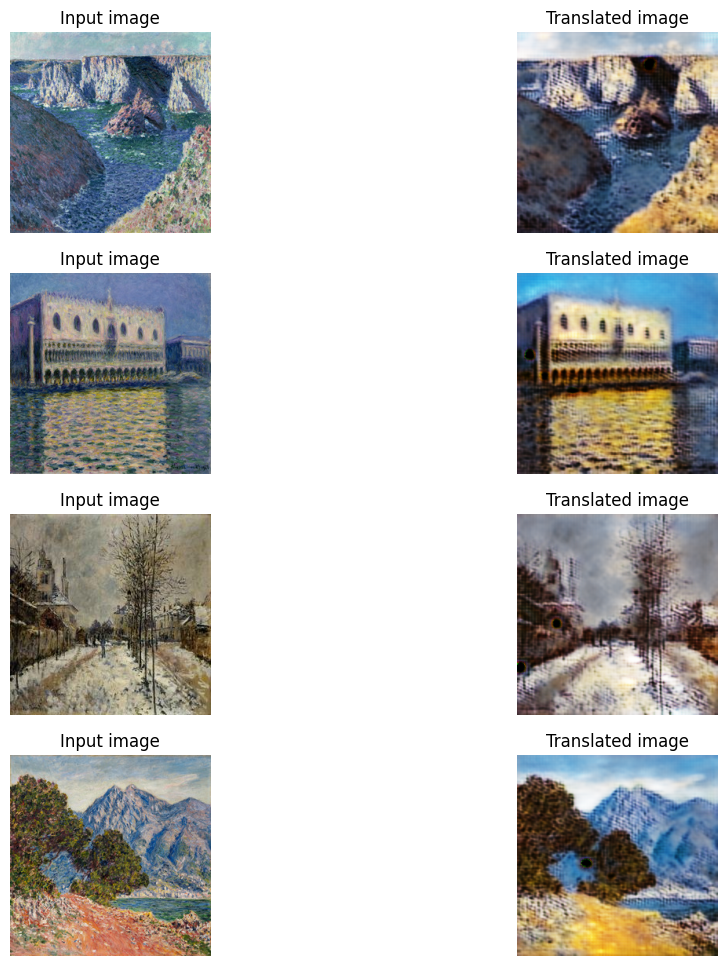

1072/1072 [==============================] - 687s 641ms/step - G_loss: 3.0289 - F_loss: 2.8492 - D_X_loss: 0.2219 - D_Y_loss: 0.2051
Epoch 12/20
1072/1072 [==============================] - ETA: 0s - G_loss: 3.0146 - F_loss: 2.7976 - D_X_loss: 0.2216 - D_Y_loss: 0.2046

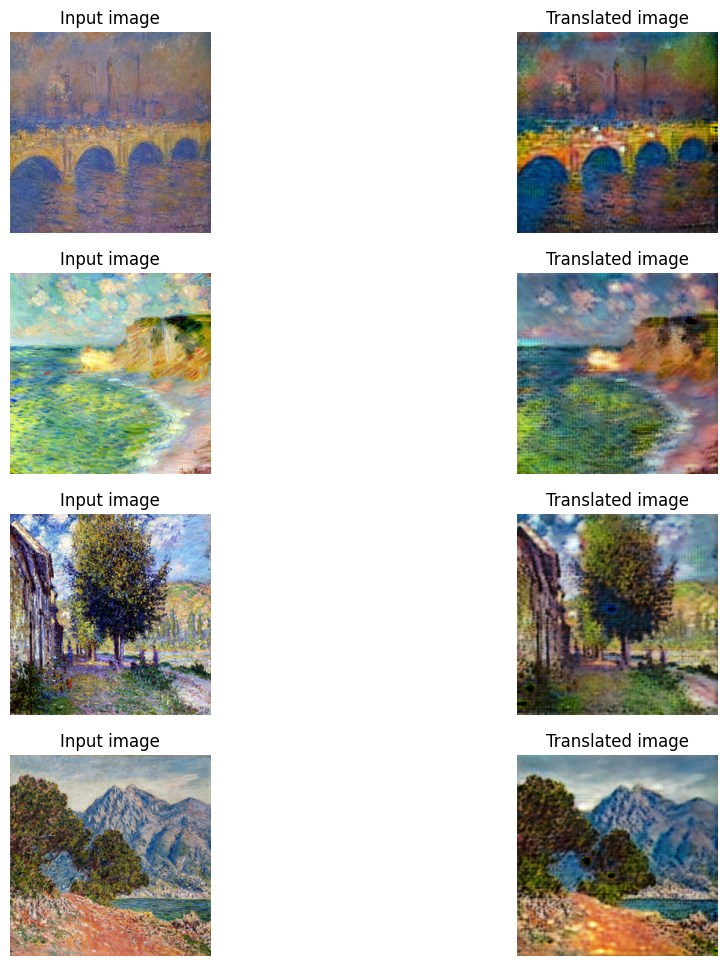

1072/1072 [==============================] - 694s 647ms/step - G_loss: 3.0149 - F_loss: 2.7968 - D_X_loss: 0.2216 - D_Y_loss: 0.2048
Epoch 13/20
1072/1072 [==============================] - ETA: 0s - G_loss: 2.9431 - F_loss: 2.7240 - D_X_loss: 0.2231 - D_Y_loss: 0.2081

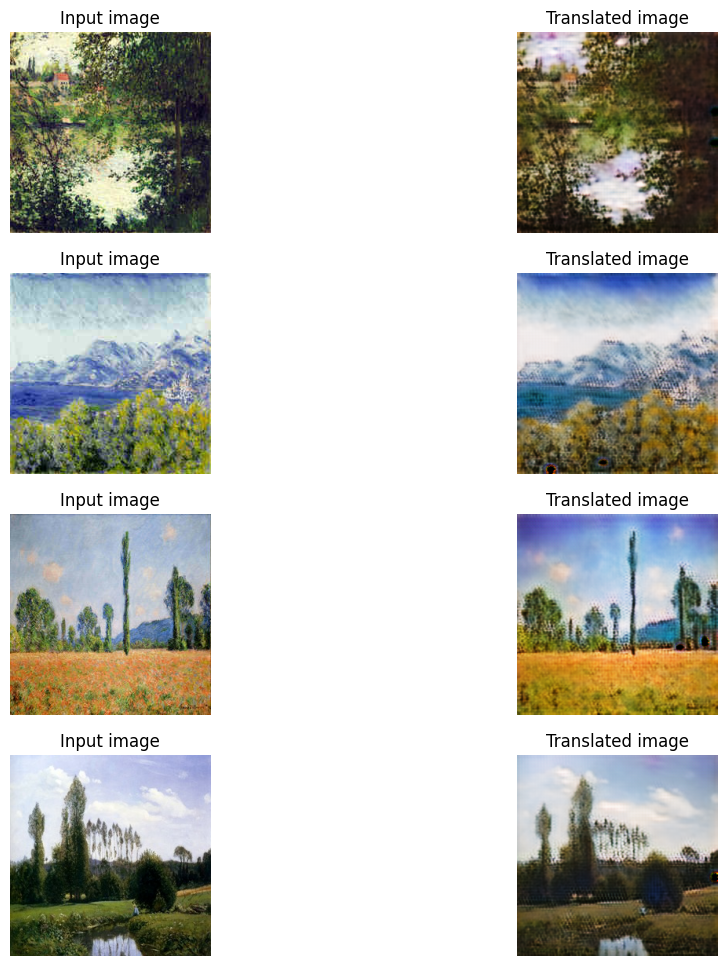

1072/1072 [==============================] - 690s 643ms/step - G_loss: 2.9427 - F_loss: 2.7241 - D_X_loss: 0.2230 - D_Y_loss: 0.2081
Epoch 14/20
1072/1072 [==============================] - ETA: 0s - G_loss: 2.9798 - F_loss: 2.6998 - D_X_loss: 0.2257 - D_Y_loss: 0.2056

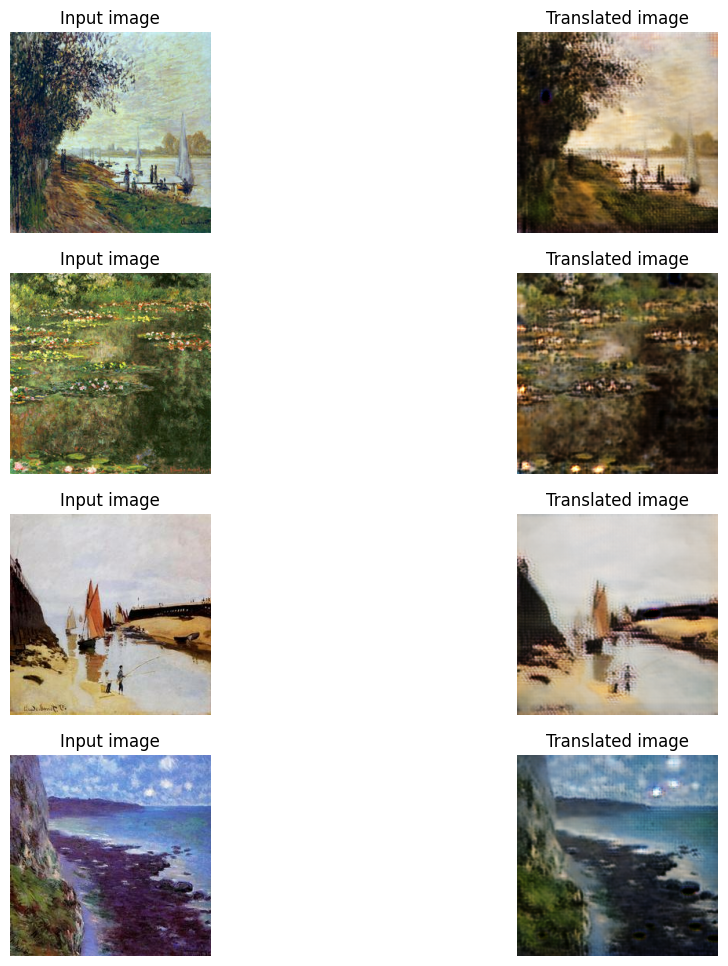

1072/1072 [==============================] - 692s 644ms/step - G_loss: 2.9797 - F_loss: 2.6995 - D_X_loss: 0.2257 - D_Y_loss: 0.2056
Epoch 15/20
1072/1072 [==============================] - ETA: 0s - G_loss: 2.9033 - F_loss: 2.6552 - D_X_loss: 0.2271 - D_Y_loss: 0.2027

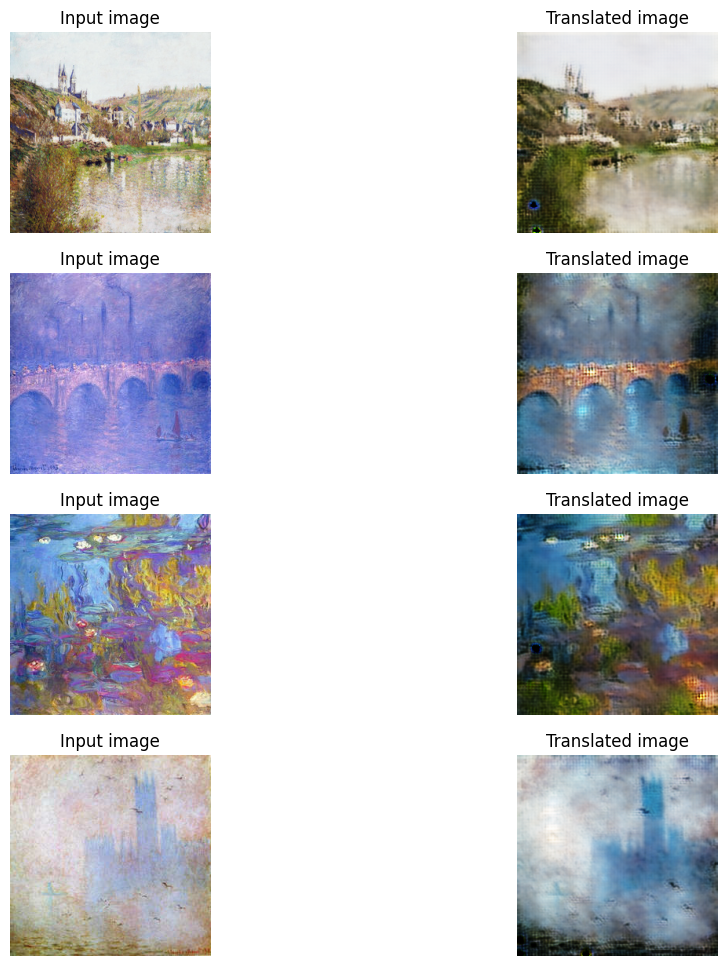

1072/1072 [==============================] - 694s 647ms/step - G_loss: 2.9048 - F_loss: 2.6549 - D_X_loss: 0.2271 - D_Y_loss: 0.2027
Epoch 16/20
1072/1072 [==============================] - ETA: 0s - G_loss: 2.8426 - F_loss: 2.6377 - D_X_loss: 0.2245 - D_Y_loss: 0.2041

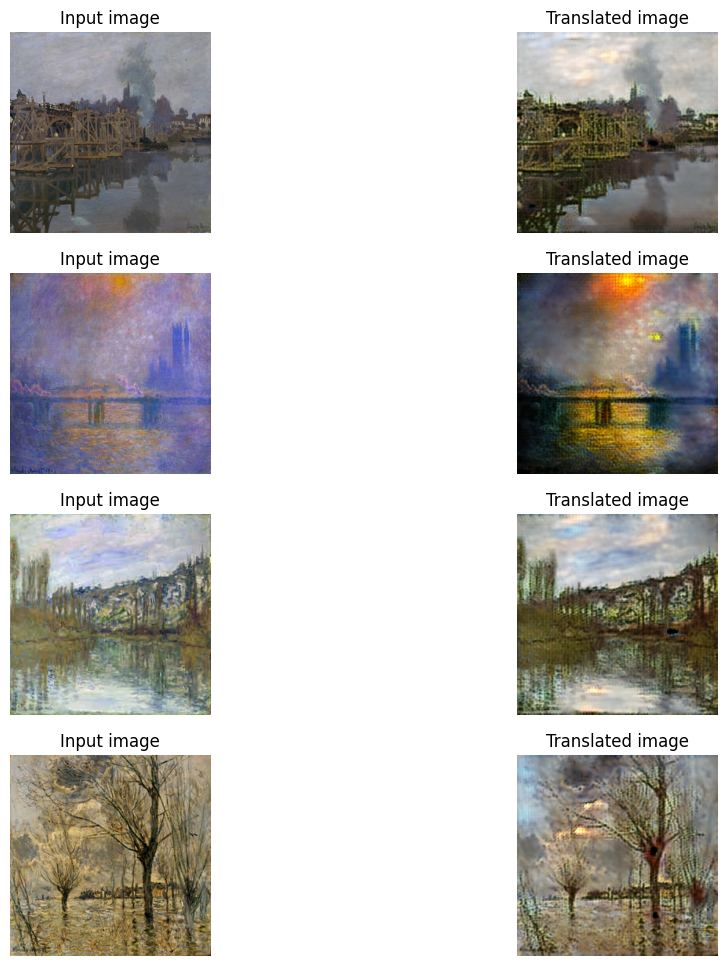

1072/1072 [==============================] - 692s 645ms/step - G_loss: 2.8418 - F_loss: 2.6373 - D_X_loss: 0.2245 - D_Y_loss: 0.2042
Epoch 17/20
1072/1072 [==============================] - ETA: 0s - G_loss: 2.8770 - F_loss: 2.6233 - D_X_loss: 0.2264 - D_Y_loss: 0.2069

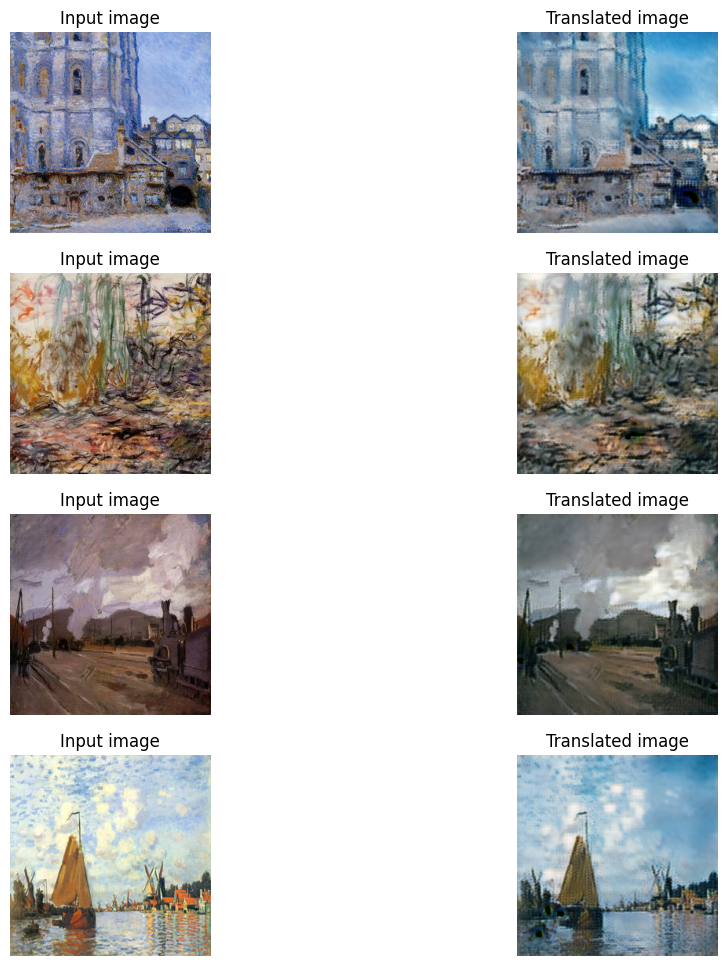

1072/1072 [==============================] - 694s 647ms/step - G_loss: 2.8798 - F_loss: 2.6232 - D_X_loss: 0.2264 - D_Y_loss: 0.2069
Epoch 18/20
1072/1072 [==============================] - ETA: 0s - G_loss: 2.8070 - F_loss: 2.5951 - D_X_loss: 0.2237 - D_Y_loss: 0.2088

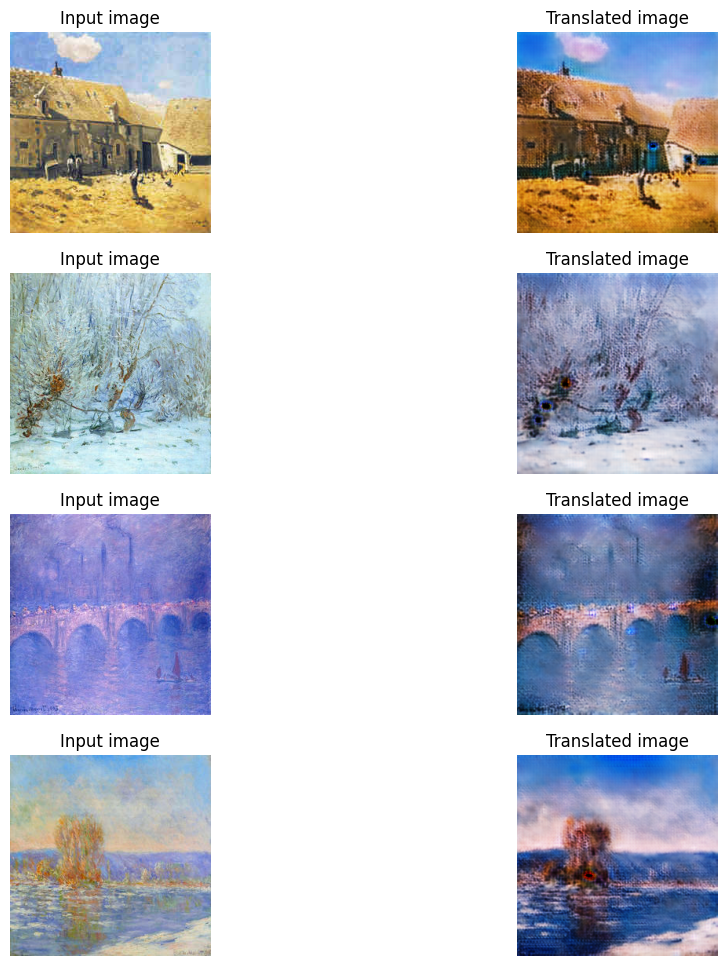

1072/1072 [==============================] - 690s 643ms/step - G_loss: 2.8087 - F_loss: 2.5942 - D_X_loss: 0.2237 - D_Y_loss: 0.2089
Epoch 19/20
 805/1072 [=====================>........] - ETA: 2:48 - G_loss: 2.7739 - F_loss: 2.5747 - D_X_loss: 0.2267 - D_Y_loss: 0.2093

In [ ]:
# Loss function for evaluating adversarial loss
adv_loss_fn = keras.losses.MeanSquaredError()

# Define the loss function for the generators
def generator_loss_fn(fake):
    fake_loss = adv_loss_fn(tf.ones_like(fake), fake)
    return fake_loss


# Define the loss function for the discriminators
def discriminator_loss_fn(real, fake):
    real_loss = adv_loss_fn(tf.ones_like(real), real)
    fake_loss = adv_loss_fn(tf.zeros_like(fake), fake)
    return (real_loss + fake_loss) * 0.5


# Create cycle gan model
cycle_gan_model = CycleGan(
    generator_G=gen_G, generator_F=gen_F, discriminator_X=disc_X, discriminator_Y=disc_Y
)

# Compile the model
cycle_gan_model.compile(
    gen_G_optimizer=keras.optimizers.legacy.Adam(learning_rate=2e-4, beta_1=0.5),
    gen_F_optimizer=keras.optimizers.legacy.Adam(learning_rate=2e-4, beta_1=0.5),
    disc_X_optimizer=keras.optimizers.legacy.Adam(learning_rate=2e-4, beta_1=0.5),
    disc_Y_optimizer=keras.optimizers.legacy.Adam(learning_rate=2e-4, beta_1=0.5),
    gen_loss_fn=generator_loss_fn,
    disc_loss_fn=discriminator_loss_fn,
)
# Callbacks
plotter = GANMonitor()
checkpoint_filepath = "./model_checkpoints/cyclegan_checkpoints.{epoch:03d}"
model_checkpoint_callback = keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath, save_weights_only=True
)

# Here we will train the model for just one epoch as each epoch takes around
# 7 minutes on a single P100 backed machine.
cycle_gan_model.fit(
    tf.data.Dataset.zip((train_monet, train_photo)),
    epochs=20,
    callbacks=[plotter, model_checkpoint_callback],
)

In [ ]:
import os

# path of the directory
directoryPath = "./"

# Checking the length of list
if len(os.listdir(directoryPath)) == 0:
		print("No files found in the directory.")
else:
		print("Some files found in the directory.")


Some files found in the directory.


In [ ]:
# Get the list of all files and directories
path = "./model_checkpoints"
dir_list = os.listdir(path)
print("Files and directories in '", path, "' :")
# prints all files
print(dir_list)

FileNotFoundError: [Errno 2] No such file or directory: './model_checkpoints'

In [ ]:
import os

In [ ]:
# Load the checkpoints
weight_file = "./model_checkpoints/cyclegan_checkpoints.018"              #change to 020
cycle_gan_model.load_weights(weight_file).expect_partial()
print("Weights loaded successfully")

_, ax = plt.subplots(4, 2, figsize=(10, 15))
for i, img in enumerate(test_photo.take(5)):                                #change to monet if vice-versa, and change 4 to any number
    prediction = cycle_gan_model.gen_G(img, training=False)[0].numpy()
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

    ax[i, 0].imshow(img)
    ax[i, 1].imshow(prediction)
    ax[i, 0].set_title("Input image")
    ax[i, 0].set_title("Input image")
    ax[i, 1].set_title("Translated image")
    ax[i, 0].axis("off")
    ax[i, 1].axis("off")

    prediction = keras.utils.array_to_img(prediction)
    prediction.save("predicted_img_{i}.png".format(i=i))
plt.tight_layout()
plt.show()

NameError: name 'cycle_gan_model' is not defined